<a href="https://colab.research.google.com/github/mitsuhazuki/deep-image-prior/blob/master/test_denoising.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [7]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/mitsuhazuki/deep-image-prior
!mv deep-image-prior/* ./

fatal: destination path 'deep-image-prior' already exists and is not an empty directory.
mv: cannot stat 'deep-image-prior/*': No such file or directory


# Import libs

In [8]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [9]:
## denoising
# image must be 24 bit color
fname = 'data/test_images/Lichtenstein.png'

# Load image

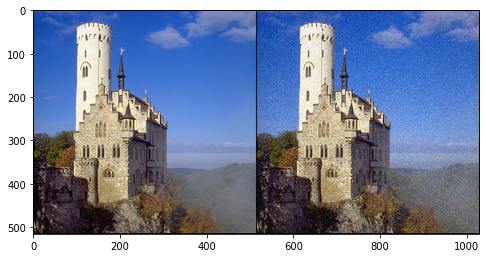

In [10]:
# Add synthetic noise
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6)

# Setup

In [11]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99


num_iter = 3000
input_depth = 32
figsize = 4


net = get_net(input_depth, 'skip', pad,
              skip_n33d=128,
              skip_n33u=128,
              skip_n11=4,
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()])
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


# Optimize

Starting optimization with ADAM
Iteration 00000    Loss 0.081987   PSNR_noisy: 10.862540   PSRN_gt: 11.287162 PSNR_gt_sm: 11.287162

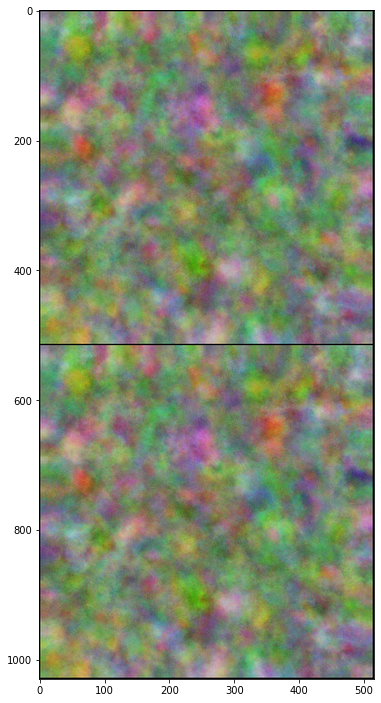

Iteration 00100    Loss 0.017699   PSNR_noisy: 17.520507   PSRN_gt: 20.440477 PSNR_gt_sm: 16.999248

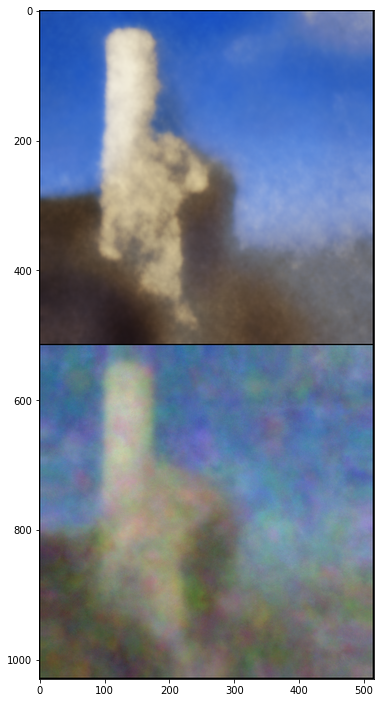

Iteration 00200    Loss 0.014731   PSNR_noisy: 18.317538   PSRN_gt: 22.255740 PSNR_gt_sm: 20.830647

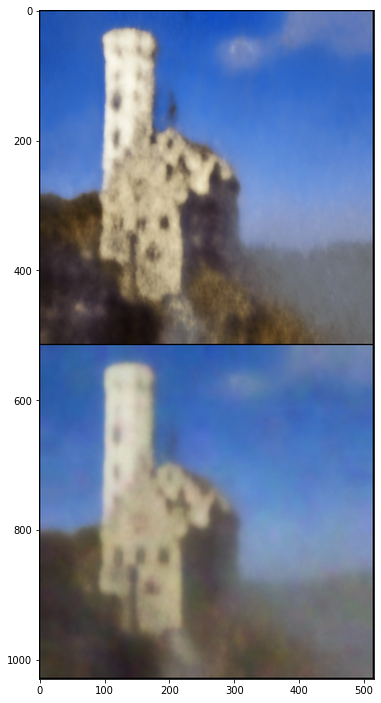

Iteration 00300    Loss 0.013719   PSNR_noisy: 18.626838   PSRN_gt: 23.104386 PSNR_gt_sm: 22.755457

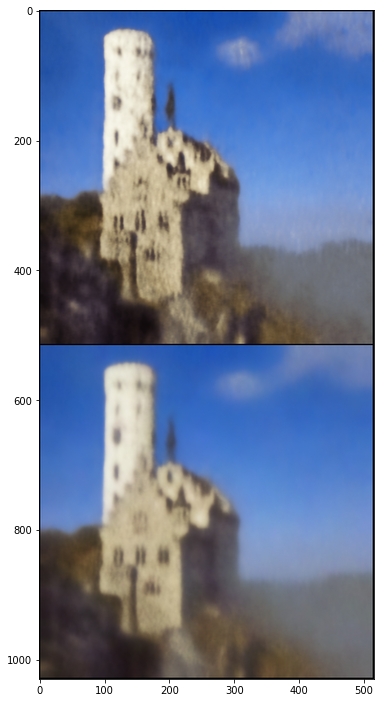

Iteration 00400    Loss 0.013136   PSNR_noisy: 18.815340   PSRN_gt: 23.668417 PSNR_gt_sm: 23.832388

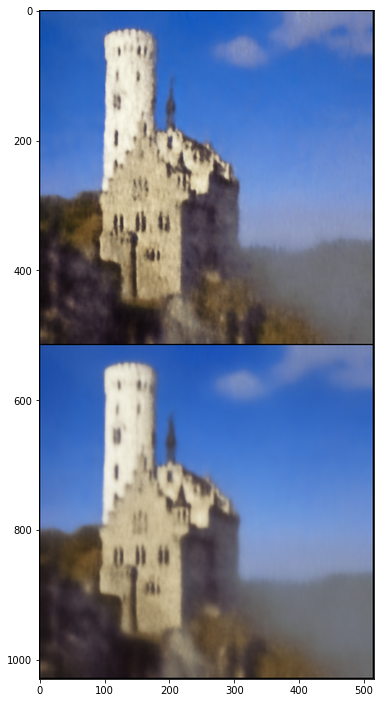

Iteration 00500    Loss 0.012555   PSNR_noisy: 19.012005   PSRN_gt: 24.288959 PSNR_gt_sm: 24.552870

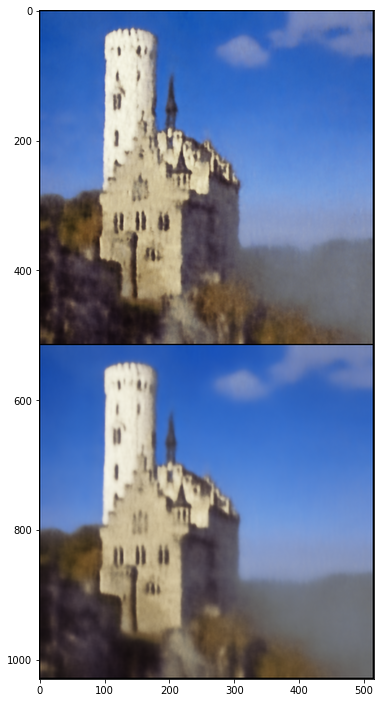

Iteration 00600    Loss 0.012194   PSNR_noisy: 19.138448   PSRN_gt: 24.737321 PSNR_gt_sm: 25.106575

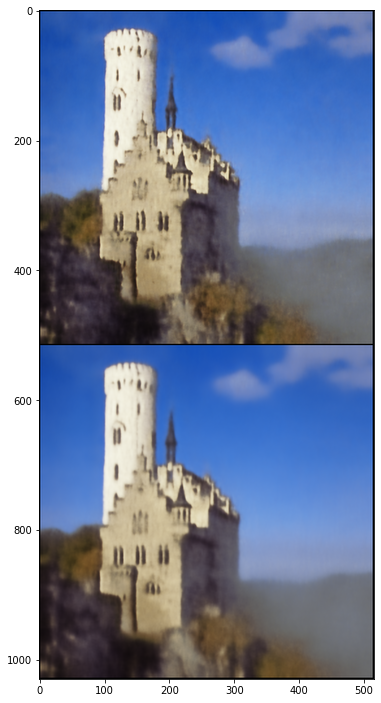

Iteration 00700    Loss 0.011961   PSNR_noisy: 19.222245   PSRN_gt: 25.049620 PSNR_gt_sm: 25.579015

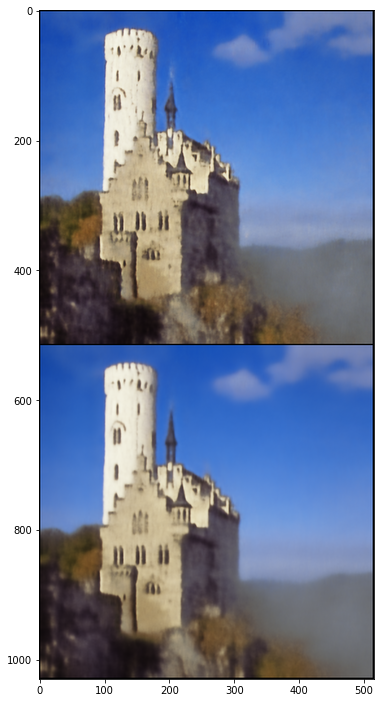

Iteration 00800    Loss 0.011671   PSNR_noisy: 19.328949   PSRN_gt: 25.462182 PSNR_gt_sm: 26.002235

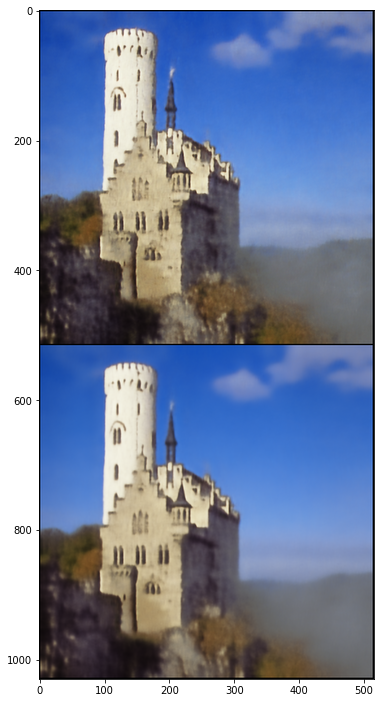

Iteration 00900    Loss 0.011522   PSNR_noisy: 19.384753   PSRN_gt: 25.677512 PSNR_gt_sm: 26.372246

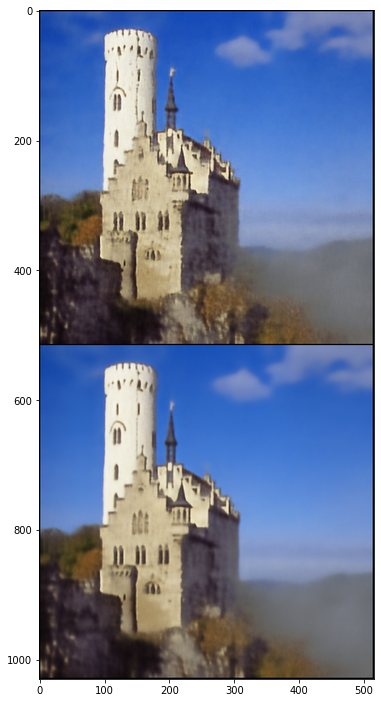

Iteration 01000    Loss 0.011347   PSNR_noisy: 19.451158   PSRN_gt: 25.988404 PSNR_gt_sm: 26.694253

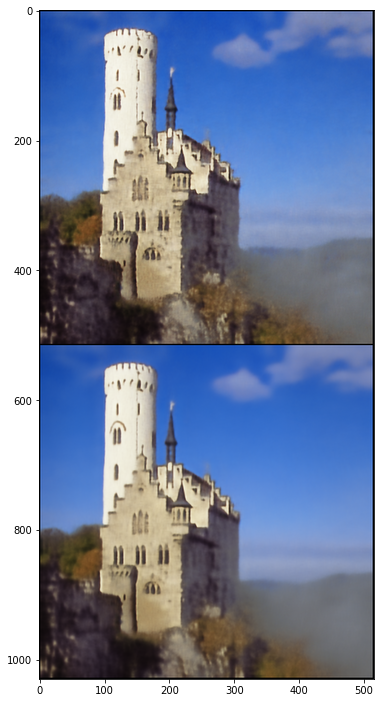

Iteration 01100    Loss 0.011130   PSNR_noisy: 19.535179   PSRN_gt: 26.334632 PSNR_gt_sm: 26.997993

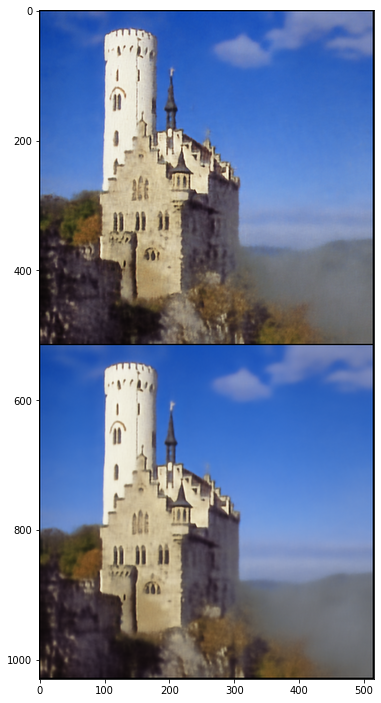

Iteration 01200    Loss 0.011028   PSNR_noisy: 19.574919   PSRN_gt: 26.509886 PSNR_gt_sm: 27.279623

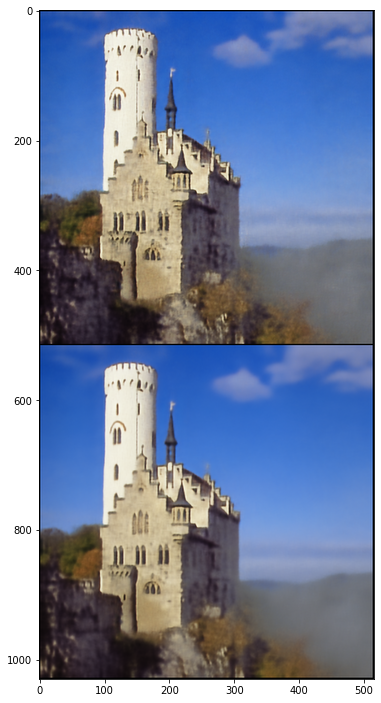

Iteration 01300    Loss 0.010901   PSNR_noisy: 19.625479   PSRN_gt: 26.697228 PSNR_gt_sm: 27.560155

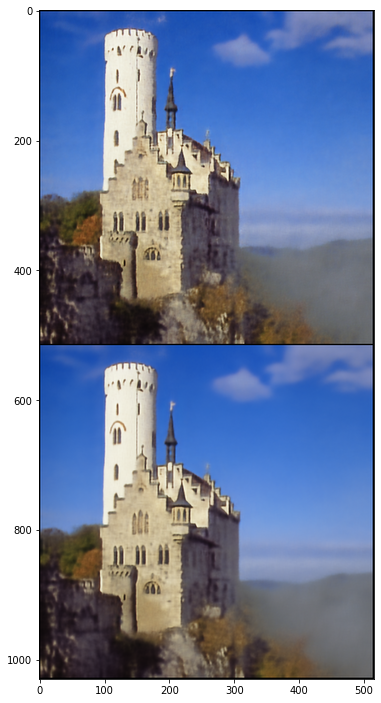

Iteration 01400    Loss 0.010776   PSNR_noisy: 19.675532   PSRN_gt: 26.925062 PSNR_gt_sm: 27.818553

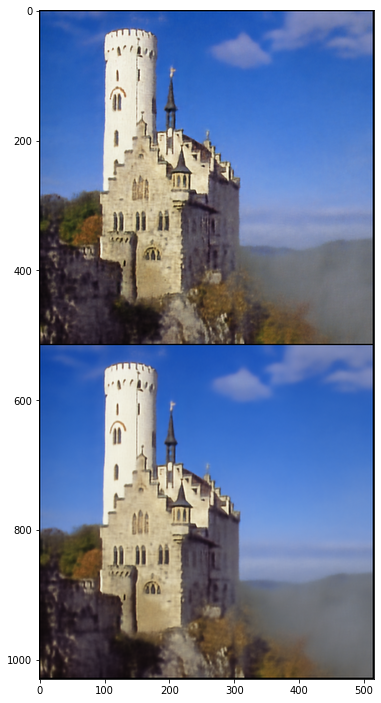

Iteration 01500    Loss 0.010699   PSNR_noisy: 19.706749   PSRN_gt: 27.058174 PSNR_gt_sm: 28.063561

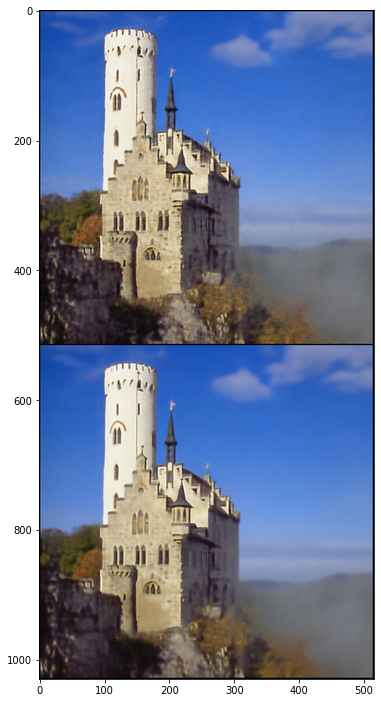

Iteration 01600    Loss 0.010596   PSNR_noisy: 19.748712   PSRN_gt: 27.282612 PSNR_gt_sm: 28.289368

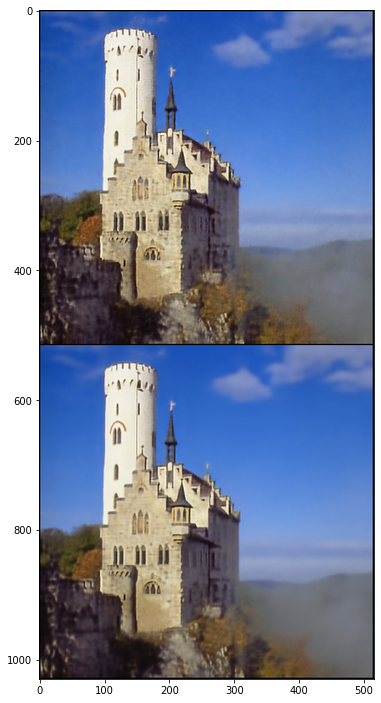

Iteration 01700    Loss 0.010491   PSNR_noisy: 19.791879   PSRN_gt: 27.482675 PSNR_gt_sm: 28.490975

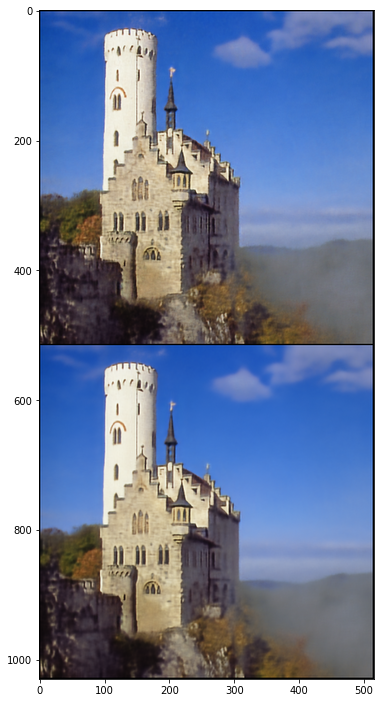

Iteration 01800    Loss 0.010456   PSNR_noisy: 19.806432   PSRN_gt: 27.525349 PSNR_gt_sm: 28.683110

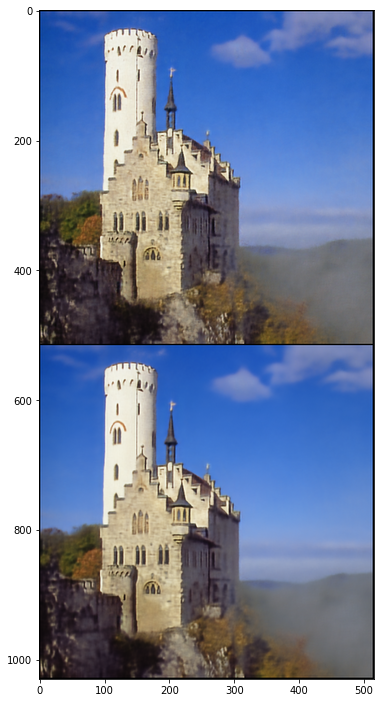

Iteration 01900    Loss 0.010301   PSNR_noisy: 19.871259   PSRN_gt: 27.837568 PSNR_gt_sm: 28.866907

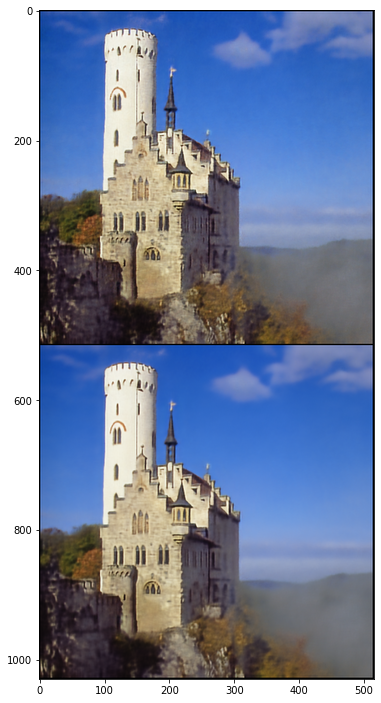

Iteration 02000    Loss 0.010262   PSNR_noisy: 19.887523   PSRN_gt: 27.924271 PSNR_gt_sm: 29.040126

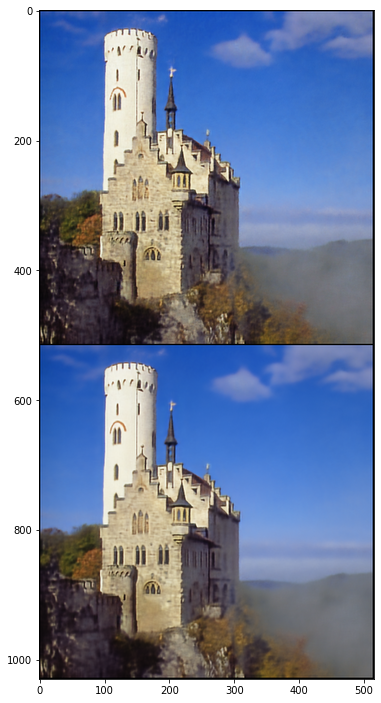

Iteration 02100    Loss 0.010193   PSNR_noisy: 19.916825   PSRN_gt: 28.042496 PSNR_gt_sm: 29.194804

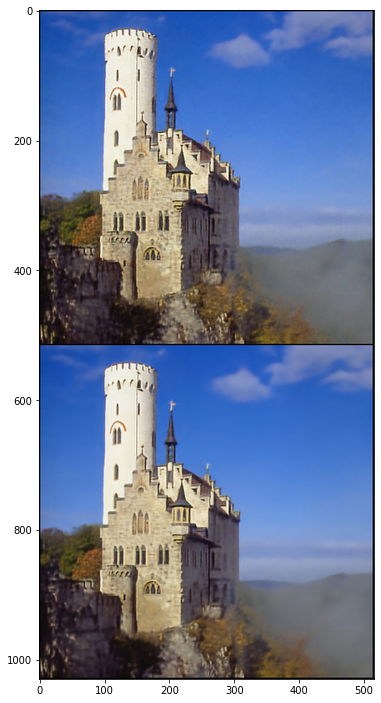

Iteration 02200    Loss 0.010126   PSNR_noisy: 19.945521   PSRN_gt: 28.135662 PSNR_gt_sm: 29.346932

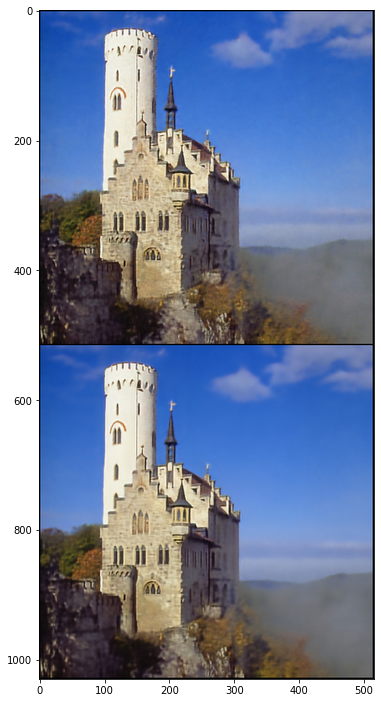

Iteration 02300    Loss 0.010054   PSNR_noisy: 19.976428   PSRN_gt: 28.295674 PSNR_gt_sm: 29.485354

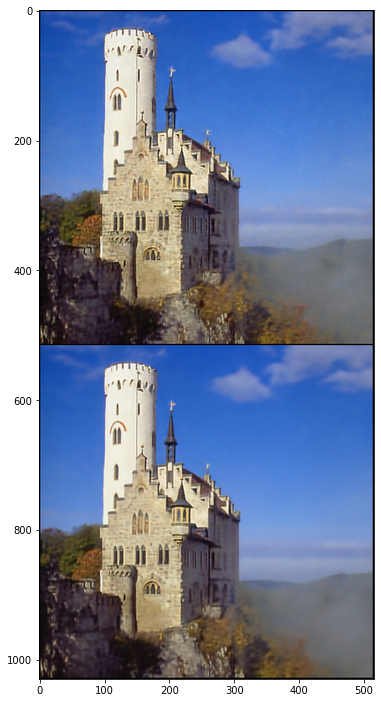

Iteration 02400    Loss 0.010033   PSNR_noisy: 19.985899   PSRN_gt: 28.350905 PSNR_gt_sm: 29.608741

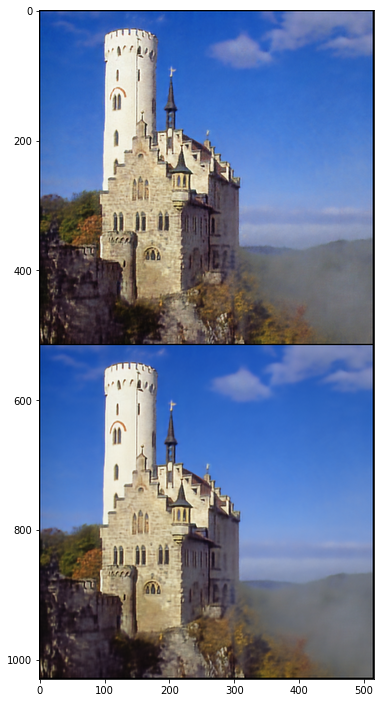

Iteration 02500    Loss 0.009926   PSNR_noisy: 20.032134   PSRN_gt: 28.558444 PSNR_gt_sm: 29.731756

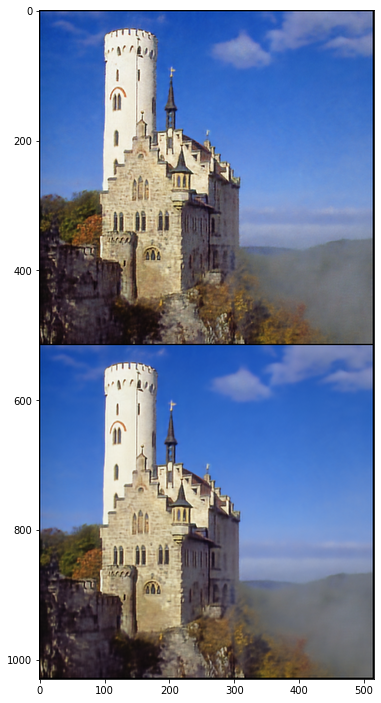

Iteration 02600    Loss 0.009884   PSNR_noisy: 20.050734   PSRN_gt: 28.593378 PSNR_gt_sm: 29.849420

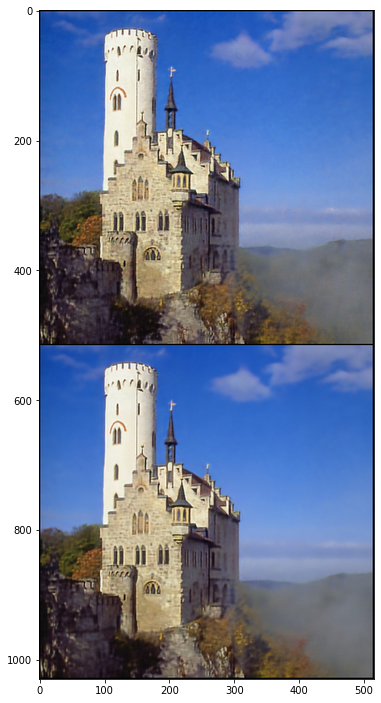

Iteration 02700    Loss 0.009865   PSNR_noisy: 20.059132   PSRN_gt: 28.599403 PSNR_gt_sm: 29.959361

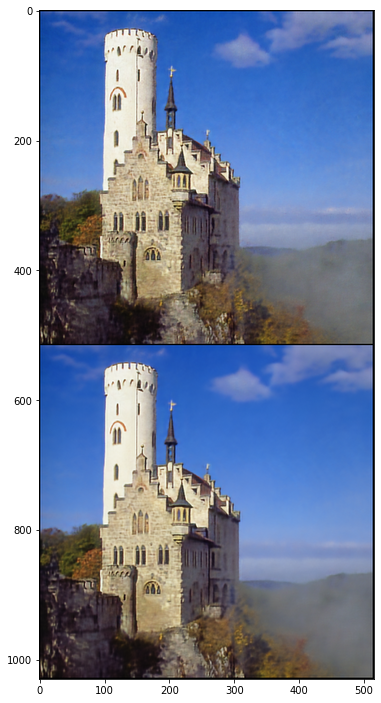

Iteration 02800    Loss 0.009811   PSNR_noisy: 20.083047   PSRN_gt: 28.549298 PSNR_gt_sm: 30.059463

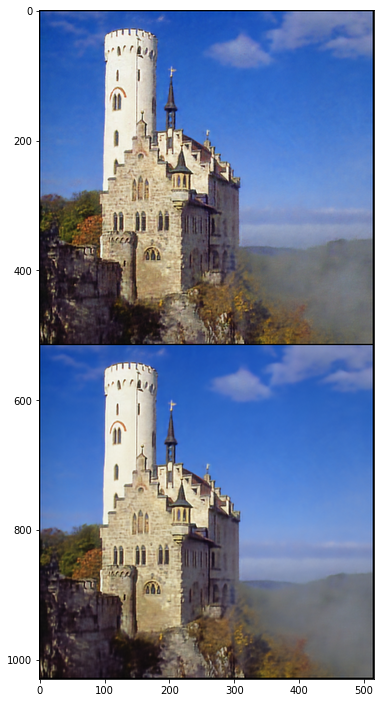

Iteration 02900    Loss 0.009735   PSNR_noisy: 20.116666   PSRN_gt: 28.790122 PSNR_gt_sm: 30.149252

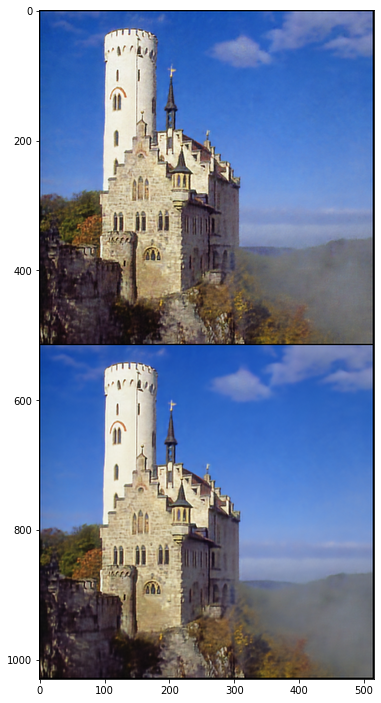

Iteration 02999    Loss 0.009701   PSNR_noisy: 20.132024   PSRN_gt: 28.689727 PSNR_gt_sm: 30.230642

In [12]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0])
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('\rIteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

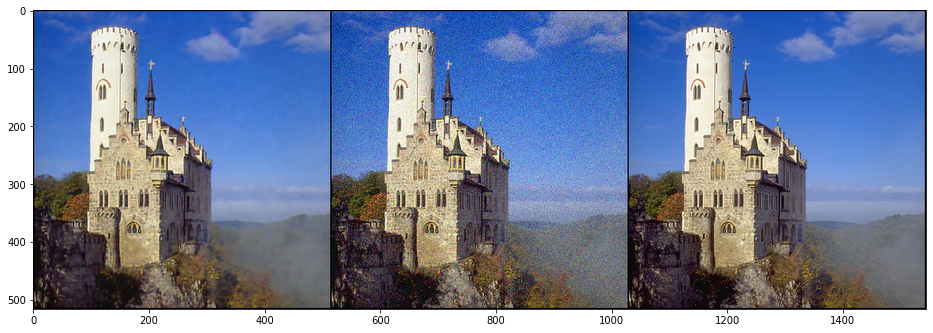

In [15]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_noisy_np, img_np], factor=13);